In [11]:
import numpy as np

with np.load('aryan_calibration_data.npz') as calibration_data:
    callibration1 = calibration_data['mtx']
    distortion1 = calibration_data['dist'][0]

print("left camera:")
print(callibration1)
print(distortion1)

with np.load('shreyansh_calibration_data.npz') as calibration_data:
    callibration2 = calibration_data['mtx']
    distortion2 = calibration_data['dist'][0]

print("\nright camera:")
print(callibration2)
print(distortion2)

left camera:
[[3.04178524e+03 0.00000000e+00 1.58771586e+03]
 [0.00000000e+00 3.03739654e+03 1.51810990e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
[ 3.94833030e-02 -4.67790713e-01  1.20152321e-03  5.50505183e-04
  1.81732987e+00]

right camera:
[[3.46352151e+03 0.00000000e+00 1.01105796e+03]
 [0.00000000e+00 3.48945346e+03 1.45451561e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
[ 0.07747068 -0.70304009 -0.02318704  0.0048968  -1.37657322]


#### Image metadata for Samsung S20 Fe(Aryan's)

In [4]:
from PIL import Image
from PIL.ExifTags import TAGS

def extract_metadata(image_path):
    img = Image.open(image_path)
    exif_data = img._getexif()
    if not exif_data:
        print("No EXIF data found.")
        return None
    # Decode EXIF tags
    return {TAGS.get(tag): value for tag, value in exif_data.items()}

metadata = extract_metadata("datasets/Camera Calibration(Samsung S20 fe)/20241116_210539.jpg")
for tag, value in metadata.items():
    print(f"{tag}: {value}")


ImageWidth: 3024
ImageLength: 3024
GPSInfo: {3: 'E', 4: (0.0, 0.0, 0.0), 5: b'\x00', 6: 0.0, 7: (0.0, 0.0, 0.0), 29: '1970:01:01'}
ResolutionUnit: 2
ExifOffset: 212
Make: samsung
Model: SM-G781B
Orientation: 6
DateTime: 2024:11:16 21:05:40
YCbCrPositioning: 1
XResolution: 72.0
YResolution: 72.0
ExifVersion: b'0220'
ComponentsConfiguration: b'\x01\x02\x03\x00'
ShutterSpeedValue: 5.645
DateTimeOriginal: 2024:11:16 21:05:40
DateTimeDigitized: 2024:11:16 21:05:40
ApertureValue: 1.69
BrightnessValue: 1.46
ExposureBiasValue: 0.0
MaxApertureValue: 1.69
MeteringMode: 2
Flash: 0
FocalLength: 5.4
ColorSpace: 1
ExifImageWidth: 3024
ExifInteroperabilityOffset: 745
SceneCaptureType: 0
OffsetTime: +05:30
OffsetTimeOriginal: +05:30
SubsecTime: 301132
SubsecTimeOriginal: 301132
SubsecTimeDigitized: 301132
ExifImageHeight: 3024
SensingMethod: 1
ExposureTime: 0.02
FNumber: 1.8
SceneType: b'\x01'
ExposureProgram: 2
ISOSpeedRatings: 200
ExposureMode: 0
FlashPixVersion: b'0100'
WhiteBalance: 0
FocalLengthI

Comparing our callibration results between opencv and using the image metadata

In [12]:
# Metadata values
focal_length_mm = 5.4  # from 'FocalLength' in mm
image_width_px = 3024  # from 'ExifImageWidth'
image_height_px = 3024  # from 'ExifImageHeight'
pixel_pitch_mm = 1.8e-3  # Pixel pitch in mm (1.8 micrometers)
# We obtained the sensor pitch from https://www.camerafv5.com/devices/manufacturers/samsung/sm-g781u_r8q_0/ (not sure if this correct, so in our implementation we are using the opencv callibration matrix only)

# Calculate focal length in pixels (f_x = f_y)
focal_length_px = focal_length_mm / pixel_pitch_mm
print(f"Focal Length in Pixels (f_x = f_y): {focal_length_px:.2f} pixels")

# Optical center (assume image center)
c_x = image_width_px / 2
c_y = image_height_px / 2
print(f"Optical Center: ({c_x}, {c_y})")

K = [
    [focal_length_px, 0, c_x],
    [0, focal_length_px, c_y],
    [0, 0, 1]
]
print("\nIntrinsic Matrix K:")
print(np.array(K))


Focal Length in Pixels (f_x = f_y): 3000.00 pixels
Optical Center: (1512.0, 1512.0)

Intrinsic Matrix K:
[[3.000e+03 0.000e+00 1.512e+03]
 [0.000e+00 3.000e+03 1.512e+03]
 [0.000e+00 0.000e+00 1.000e+00]]


This is very close to what we calculated using opencv

### Pose Estimation

Here we use the intrinsic matrix and distortion coefficients obtained from the camera callibration to estimate the pose of the camera with respect images from our callibration dataset

20241116_210622.jpg


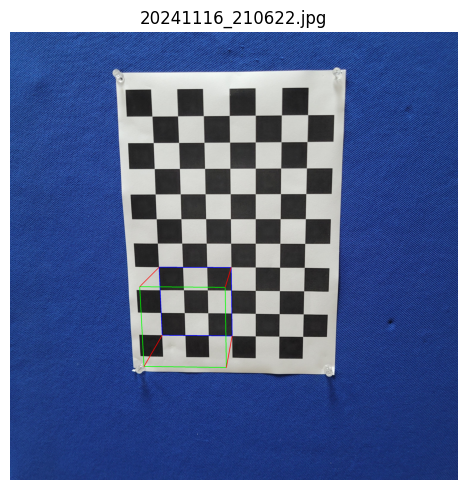

20241116_210556.jpg


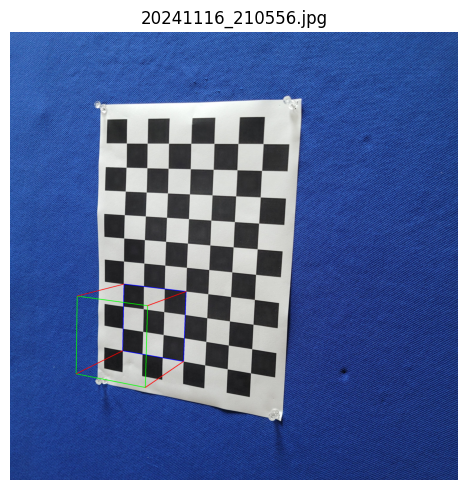

20241116_210542.jpg


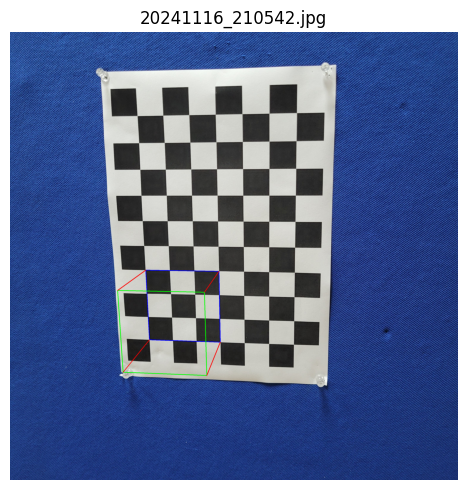

20241116_210620.jpg


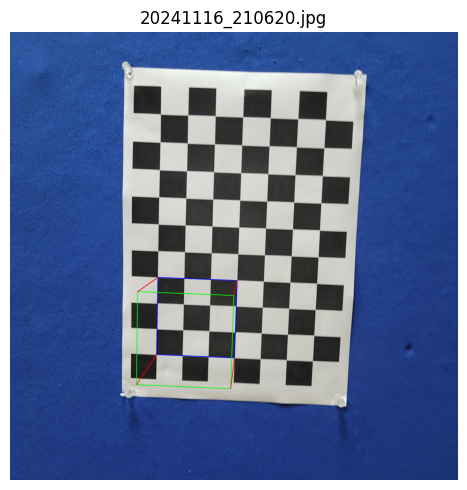

20241116_210634.jpg


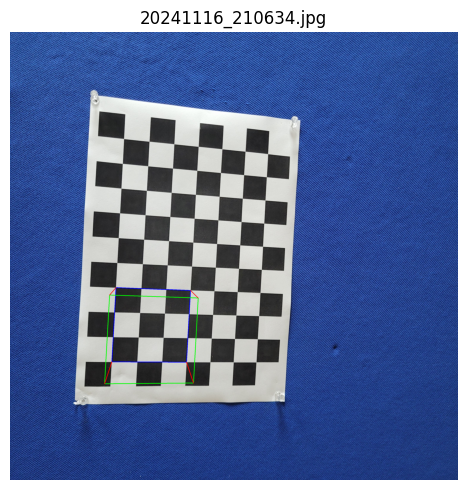

20241116_210618.jpg


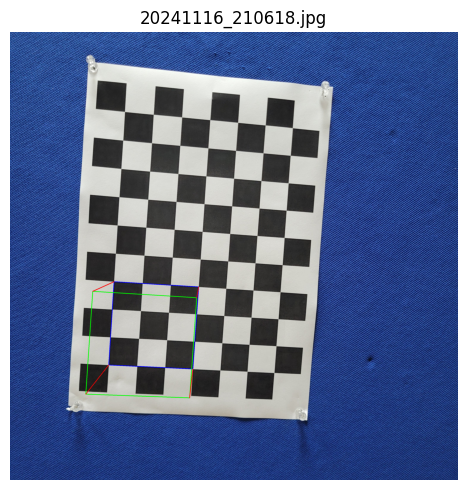

20241116_210552.jpg


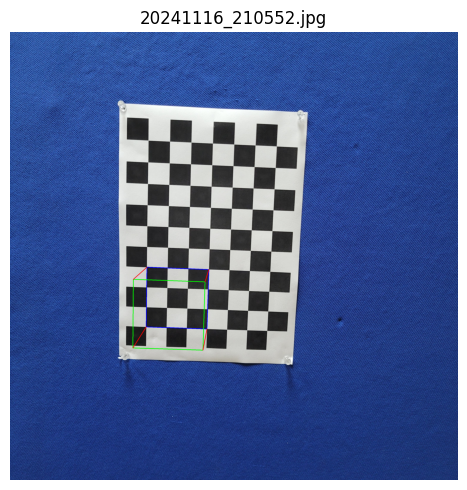

20241116_210545.jpg


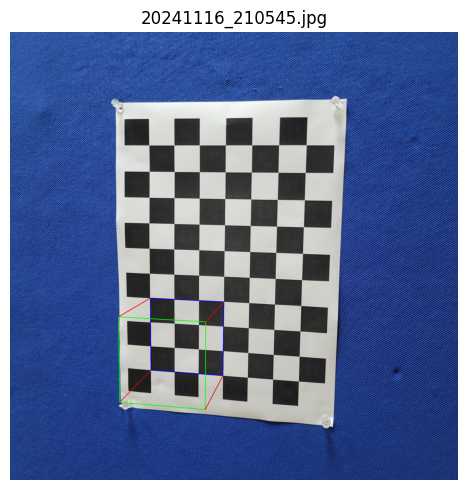

20241116_210536.jpg


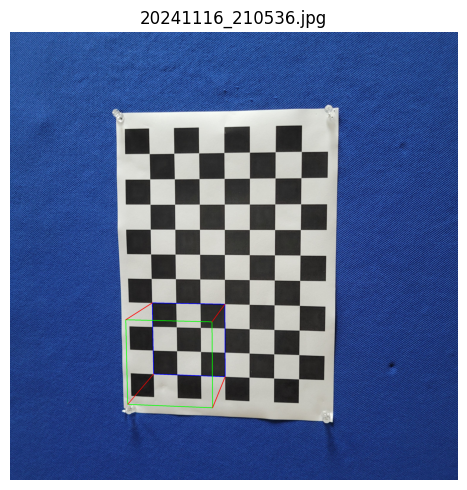

20241116_210642.jpg


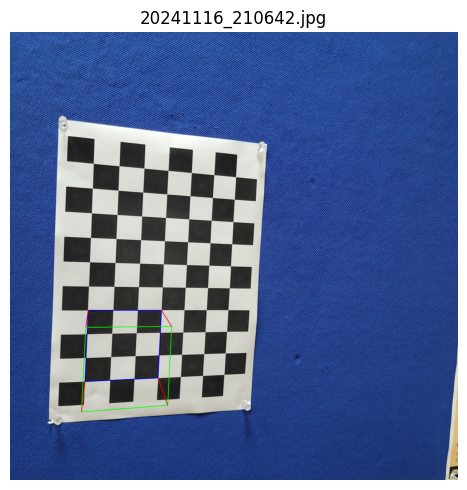

20241116_210539.jpg


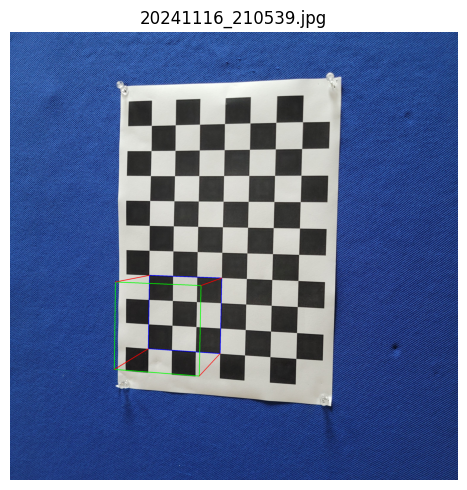

20241116_210548.jpg


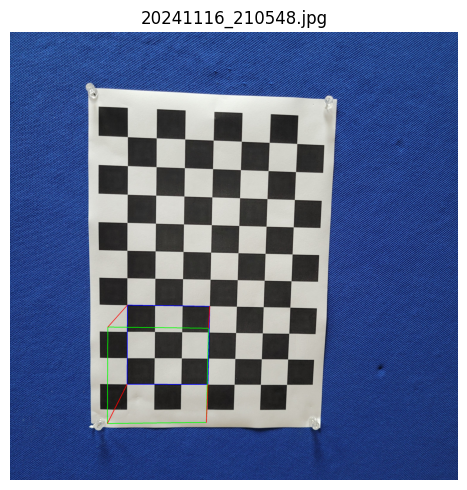

20241116_210616.jpg


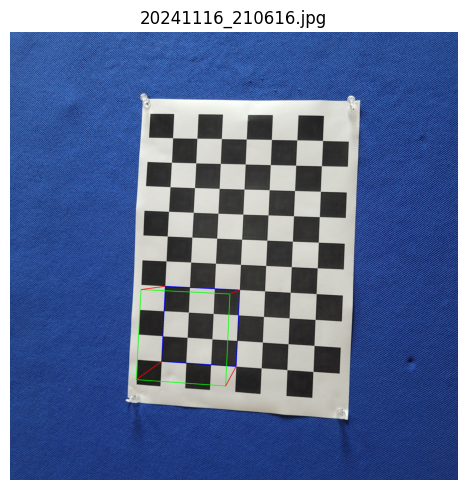

20241116_210603.jpg


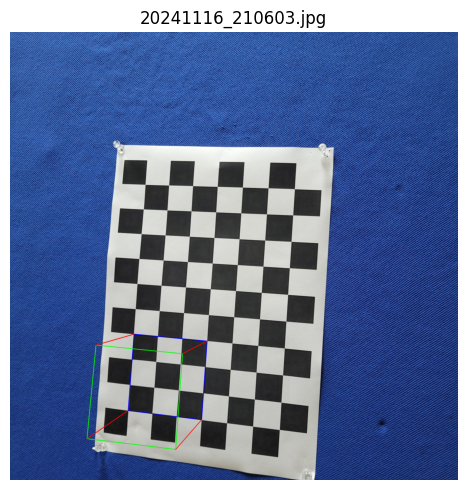

20241116_210617.jpg


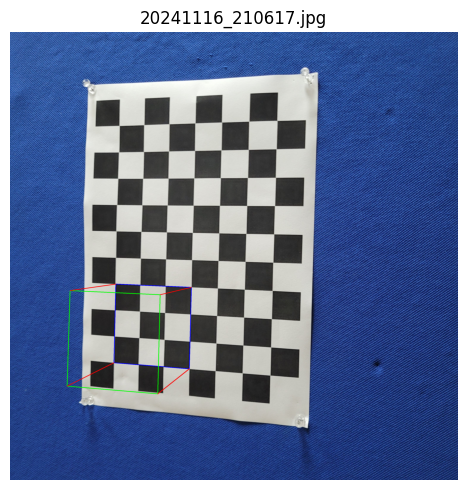

20241116_210629.jpg


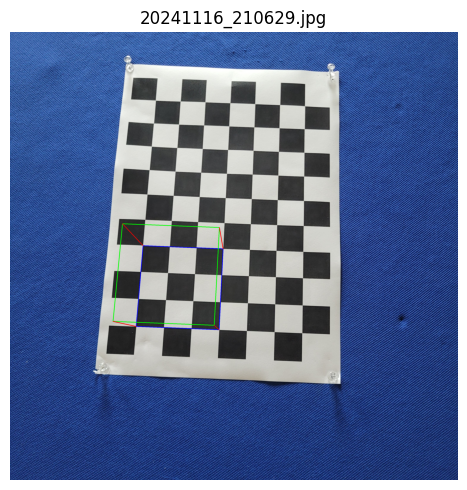

20241116_210614.jpg


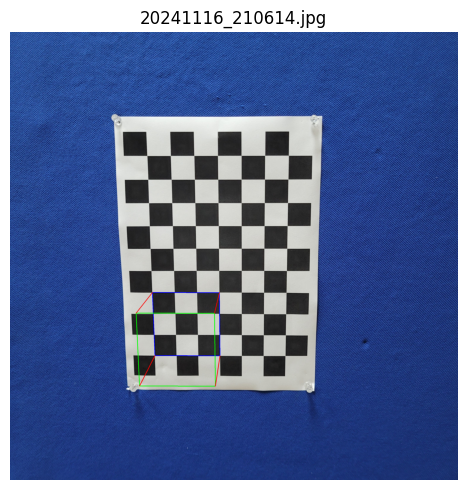

20241116_210639.jpg


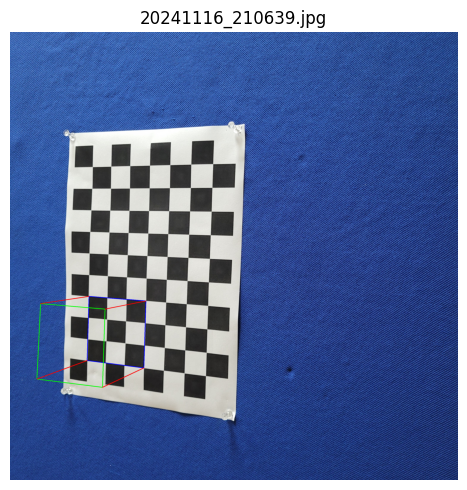

20241116_210611.jpg


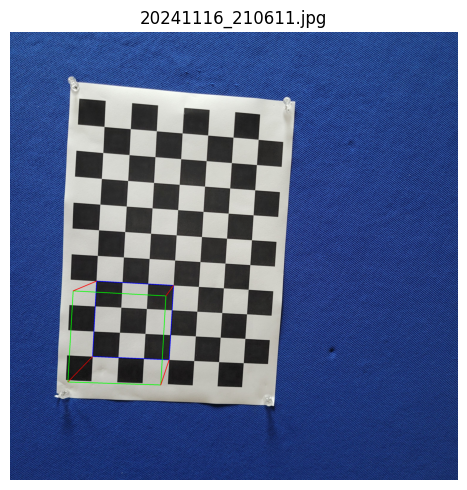

20241116_210605.jpg


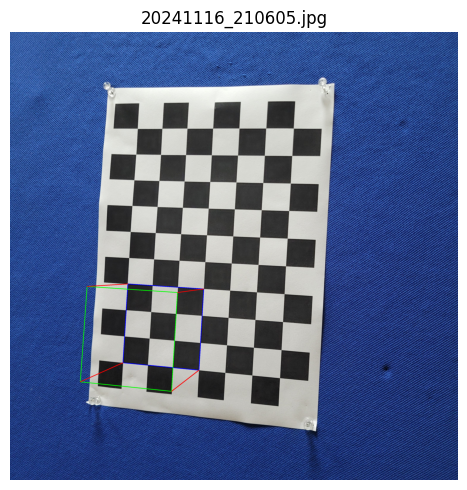

20241116_210606.jpg


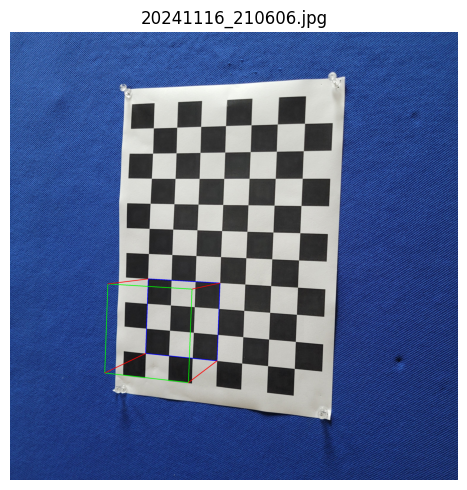

20241116_210612.jpg


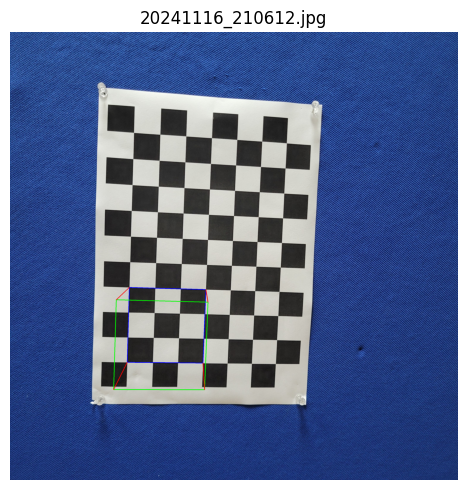

20241116_210558.jpg


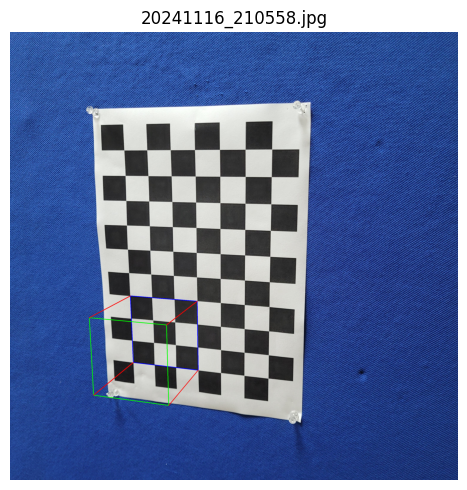

In [12]:
import os
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np

with np.load('aryan_calibration_data.npz') as calibration_data:
    callibration1 = calibration_data['mtx']
    distortion1 = calibration_data['dist'][0]


criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 30, 0.001)
objp = np.zeros((10*7,3), np.float32)
objp[:,:2] = np.mgrid[0:10,0:7].T.reshape(-1,2)

axis = np.float32([[0,0,0], [0,3,0], [3,3,0], [3,0,0],
                   [0,0,-3],[0,3,-3],[3,3,-3],[3,0,-3] ])

img_list = os.listdir('datasets/Camera Calibration(Samsung S20 fe)')
img_list = [img for img in img_list if img.endswith('.jpg')]
for filename in img_list:
    image = cv.imread('datasets/Camera Calibration(Samsung S20 fe)/' + filename)
    gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    ret, corners = cv.findChessboardCorners(gray, (10,7), None)
    if ret == True:
        corners2 = cv.cornerSubPix(gray, corners, (11,11),(-1,-1),None)
        # find the rotation and translation vectors
        pnp_ret, rvecs, tvecs, inliers = cv.solvePnPRansac(objp, corners2, callibration1, distortion1)
        # project 3D points to image plane
        if pnp_ret:
            imgpts, jac = cv.projectPoints(axis, rvecs, tvecs, callibration1, distortion1)
            imgpts = np.int32(imgpts).reshape(-1,2)
            for i in range(4):
                image = cv.line(image, tuple(imgpts[i]), tuple(imgpts[(i+1)%4]), (255,0,0), 3)
            for i in range(4,8):
                image = cv.line(image, tuple(imgpts[i]), tuple(imgpts[4 + (i+1)%4]), (0,255,0), 3)
            for i in range(4):
                image = cv.line(image, tuple(imgpts[i]), tuple(imgpts[i+4]), (0,0,255), 3)
            image_rgb = cv.cvtColor(image, cv.COLOR_BGR2RGB)
            
            print(filename)
            plt.figure(figsize=(5,5))
            plt.imshow(image_rgb)
            plt.title(filename)
            plt.axis('off')
            plt.tight_layout()
            plt.show()

cv.destroyAllWindows()

    

### Epipolar Geometry

In [1]:
from PIL import Image
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img_left = Image.open('datasets/Aryan_maingate_statue/6.jpg')
img_right = Image.open('datasets/shreyansh_maingate_statue/6.jpg')

img_left = img_left.resize((min(img_left.size[0], img_right.size[0]), min(img_left.size[1], img_right.size[1])))
img_right = img_right.resize((min(img_left.size[0], img_right.size[0]), min(img_left.size[1], img_right.size[1])))

img_left = cv.cvtColor(np.array(img_left), cv.COLOR_RGB2BGR)
img_right = cv.cvtColor(np.array(img_right), cv.COLOR_RGB2BGR)
img_left_gray = cv.cvtColor(img_left, cv.COLOR_BGR2GRAY)
img_right_gray = cv.cvtColor(img_right, cv.COLOR_BGR2GRAY)

sift = cv.SIFT_create()

keypoints_left, descriptors_left = sift.detectAndCompute(img_left_gray, None)
keypoints_right, descriptors_right = sift.detectAndCompute(img_right_gray, None)

FLANN_INDEX_KDTTREE = 0
index_params = dict(algorithm = FLANN_INDEX_KDTTREE, trees = 5)
search_params = dict(checks = 50)

flann = cv.FlannBasedMatcher(index_params, search_params)
matches = flann.knnMatch(descriptors_left, descriptors_right, k=2)

good_matches = []
points_left = []
points_right = []

# using lowe's ratio test to filter good matches
for i, (m, n) in enumerate(matches):
    if m.distance < 0.8*n.distance:
        good_matches.append(m)
        points_left.append(keypoints_left[m.queryIdx].pt)
        points_right.append(keypoints_right[m.trainIdx].pt)

In [2]:
print(f"Number of matches: {len(good_matches)}")
print(f"Matched keypoints: {[keypoints_left[m.queryIdx] for m in good_matches]}")

Number of matches: 808
Matched keypoints: [< cv2.KeyPoint 0x13fade520>, < cv2.KeyPoint 0x13fadea60>, < cv2.KeyPoint 0x13fadfc00>, < cv2.KeyPoint 0x13fafc690>, < cv2.KeyPoint 0x13fafced0>, < cv2.KeyPoint 0x13fafd860>, < cv2.KeyPoint 0x13fafda70>, < cv2.KeyPoint 0x13fafe7c0>, < cv2.KeyPoint 0x13fafe910>, < cv2.KeyPoint 0x13fafea60>, < cv2.KeyPoint 0x13fb02a60>, < cv2.KeyPoint 0x13fb04a80>, < cv2.KeyPoint 0x13fb06820>, < cv2.KeyPoint 0x13fb079f0>, < cv2.KeyPoint 0x13fb08270>, < cv2.KeyPoint 0x13fb086f0>, < cv2.KeyPoint 0x13fb09d70>, < cv2.KeyPoint 0x13fb0eca0>, < cv2.KeyPoint 0x13fb0ed60>, < cv2.KeyPoint 0x13fb0f1b0>, < cv2.KeyPoint 0x13fb11830>, < cv2.KeyPoint 0x13fb11e00>, < cv2.KeyPoint 0x13fb11e30>, < cv2.KeyPoint 0x13fb14150>, < cv2.KeyPoint 0x13fb15cb0>, < cv2.KeyPoint 0x13fb16610>, < cv2.KeyPoint 0x13fb1a6d0>, < cv2.KeyPoint 0x13fb1b990>, < cv2.KeyPoint 0x13fb1bc00>, < cv2.KeyPoint 0x13fb1bcf0>, < cv2.KeyPoint 0x13fb1c270>, < cv2.KeyPoint 0x13fb1c4e0>, < cv2.KeyPoint 0x13fb1c6c0>, 

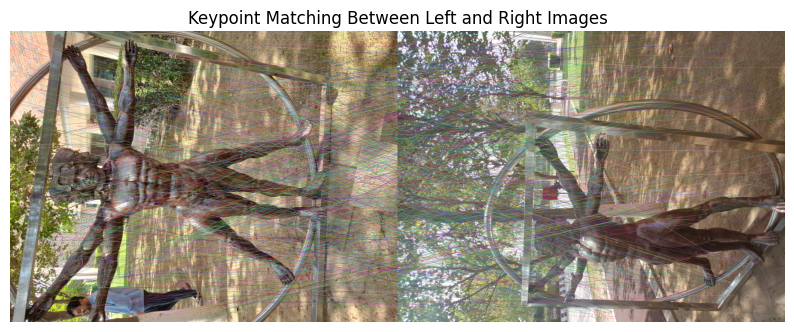

In [ ]:
matched_img = cv.drawMatches(
    img_left, keypoints_left,
    img_right, keypoints_right,
    good_matches,
    None,
    flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS,
)

plt.figure(figsize=(10, 5))
plt.imshow(cv.cvtColor(matched_img, cv.COLOR_BGR2RGB))
plt.title('Keypoint Matching Between Left and Right Images')
plt.axis('off')
plt.show()

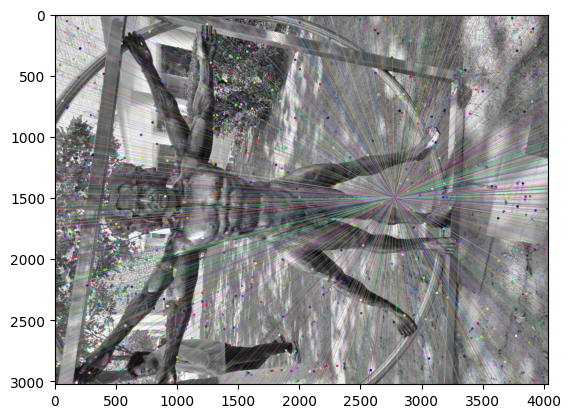

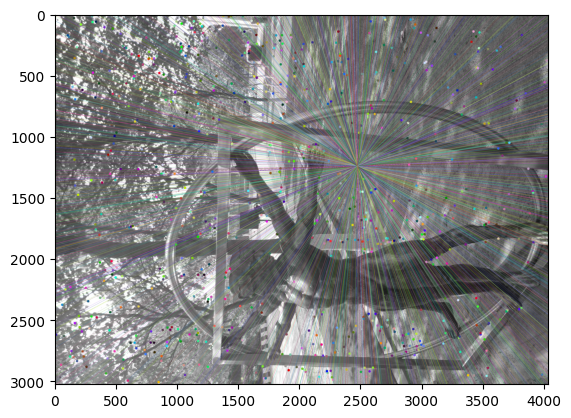

In [4]:
points_left =  np.int32(points_left)
points_right =  np.int32(points_right)
F, mask = cv.findFundamentalMat(points_left, points_right, cv.FM_LMEDS)

# select only the inlier points
points_left = points_left[mask.ravel()==1]
points_right = points_right[mask.ravel()==1]

def drawlines(img1,img2,lines,pts1,pts2):
    ''' img1 - image on which we draw the epilines for the points in img2
        lines - corresponding epilines '''
    r,c = img1.shape
    img1 = cv.cvtColor(img1,cv.COLOR_GRAY2BGR)
    img2 = cv.cvtColor(img2,cv.COLOR_GRAY2BGR)
    for r,pt1,pt2 in zip(lines,pts1,pts2):
        color = tuple(np.random.randint(0,255,3).tolist())
        x0,y0 = map(int, [0, -r[2]/r[1] ])
        x1,y1 = map(int, [c, -(r[2]+r[0]*c)/r[1] ])
        img1 = cv.line(img1, (x0,y0), (x1,y1), color,1)
        img1 = cv.circle(img1,tuple(pt1),10,color,-1)
        img2 = cv.circle(img2,tuple(pt2),10,color,-1)
    return img1,img2

# Find epilines corresponding to points in right image (second image) and
# drawing its lines on left image
lines1 = cv.computeCorrespondEpilines(points_right.reshape(-1,1,2), 2,F)
lines1 = lines1.reshape(-1,3)
img5,img6 = drawlines(img_left_gray,img_right_gray,lines1,points_left,points_right)

# Find epilines corresponding to points in left image (first image) and
# drawing its lines on right image
lines2 = cv.computeCorrespondEpilines(points_left.reshape(-1,1,2), 1,F)
lines2 = lines2.reshape(-1,3)
img3,img4 = drawlines(img_right_gray,img_left_gray,lines2,points_right,points_left)

plt.imshow(img5)
plt.show()
plt.imshow(img3)
plt.show()

### Disparity

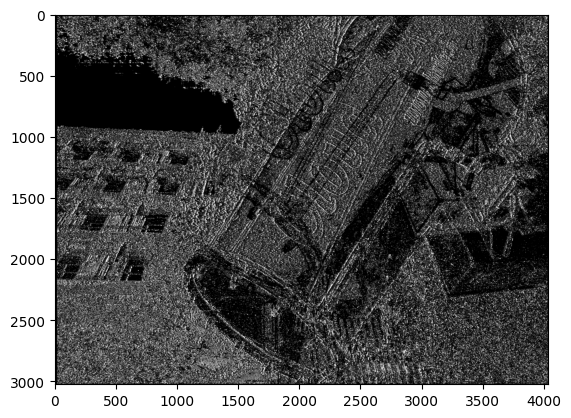

In [9]:
stereo = cv.StereoBM_create(numDisparities=16, blockSize=5)
disparity = stereo.compute(img_left_gray,img_right_gray)
plt.imshow(disparity,'gray')
plt.show()

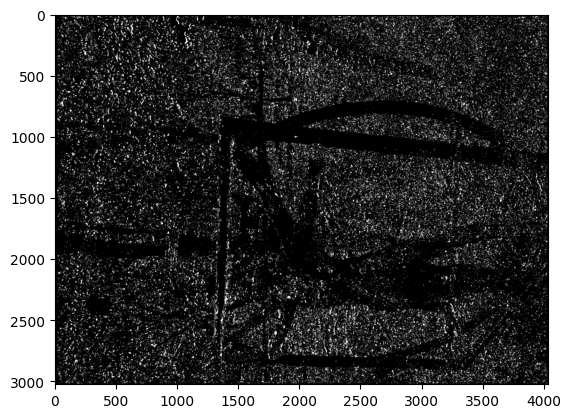

In [ ]:
stereo = cv.StereoBM_create(numDisparities=16, blockSize=11)
disparity = stereo.compute(img_left_gray,img_right_gray)
plt.imshow(disparity,'gray')
plt.show()

There are a lot of empty spaces in this images, this means that a lot of pixels in the left image are not being matched with pixels in the right image

In [8]:
print(img_left.shape)
img_right.shape

(3024, 4032, 3)


(3024, 4032, 3)